In [1]:
import pandas as pd
import plotly.express as px
from tqdm.notebook import tqdm

In [2]:
train_metadata = pd.read_csv('train_metadata.csv')
train_soundscape_labels = pd.read_csv('train_soundscape_labels.csv')
test = pd.read_csv('test.csv')

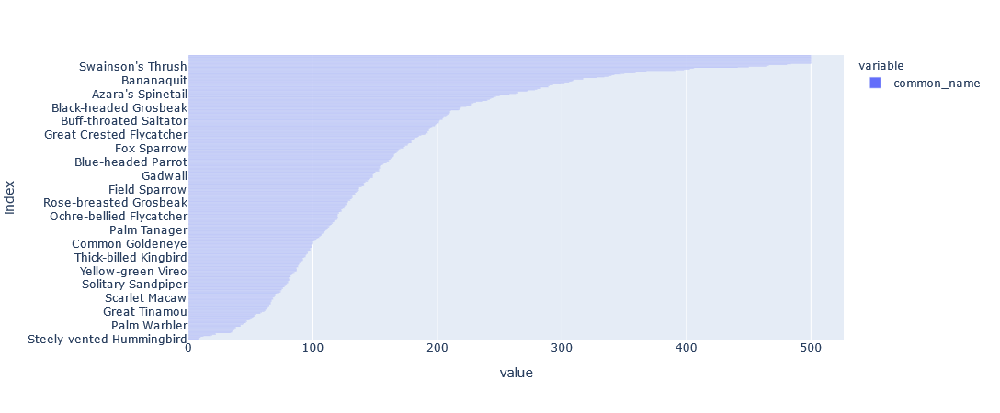

In [3]:
fig = px.bar(train_metadata['common_name'].value_counts().sort_values(ascending=True), orientation='h')
fig.show()

In [5]:
px.density_mapbox(train_metadata, lat='latitude', lon='longitude')

In [59]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math 

In [96]:
col

3

In [94]:
fig = make_subplots(rows=4, cols=2, specs=[[{'type': 'scattergeo'}, {'type': 'scattergeo'}],
                                           [{'type': 'scattergeo'}, {'type': 'scattergeo'}],
                                           [{'type': 'scattergeo'}, {'type': 'scattergeo'}],
                                           [{'type': 'scattergeo'}, {'type': 'scattergeo'}]
                                          ])

for idx, specie in enumerate(train_metadata['common_name'].value_counts().sort_values(ascending=False)[:12].index):
    col = idx%3 + 1
    row = math.floor(idx/2) + 1
    df = train_metadata[train_metadata['common_name'] == specie]
    fig.add_trace(go.Scattergeo(
        lon = df['longitude'],
        lat = df['latitude'],
        text = df['author'],
        mode = 'markers',
        #marker_color = df['common_name'],
        ),
    row = row, 
    col = col
    )
    
fig.show()

Exception: The (row, col) pair sent is out of range. Use Figure.print_grid to view the subplot grid. 

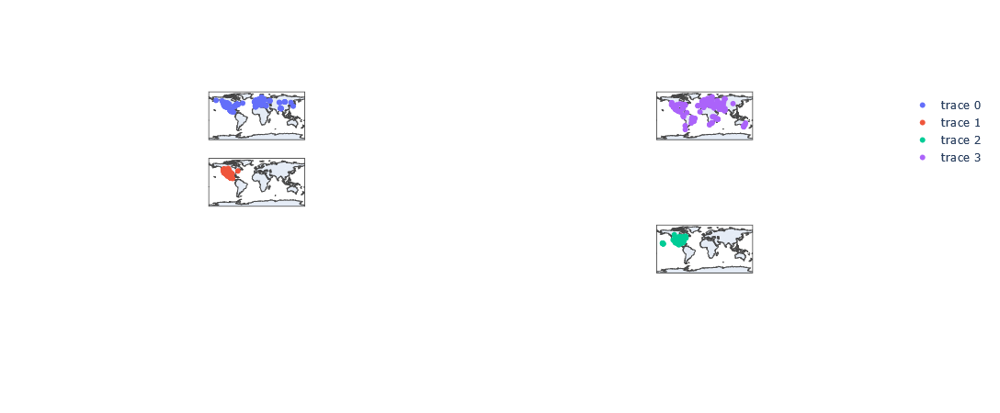

In [93]:
fig.show()

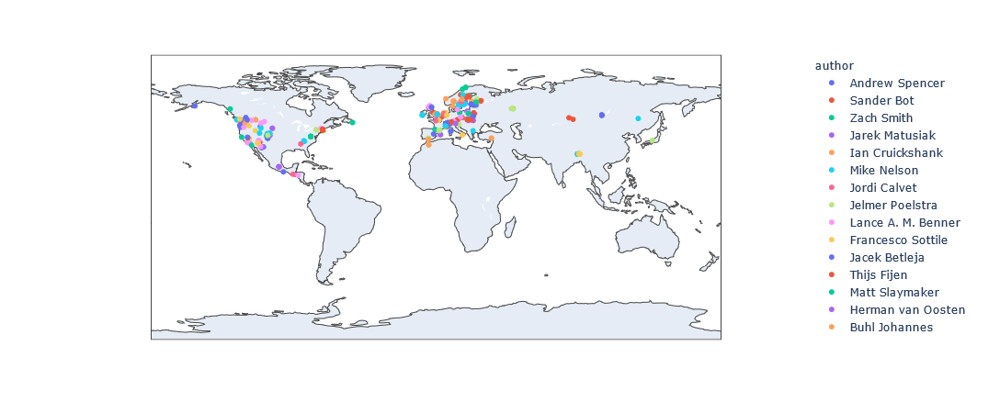

In [58]:
px.scatter_geo(train_metadata[train_metadata['common_name'] == specie], lat='latitude', lon='longitude', color='author')

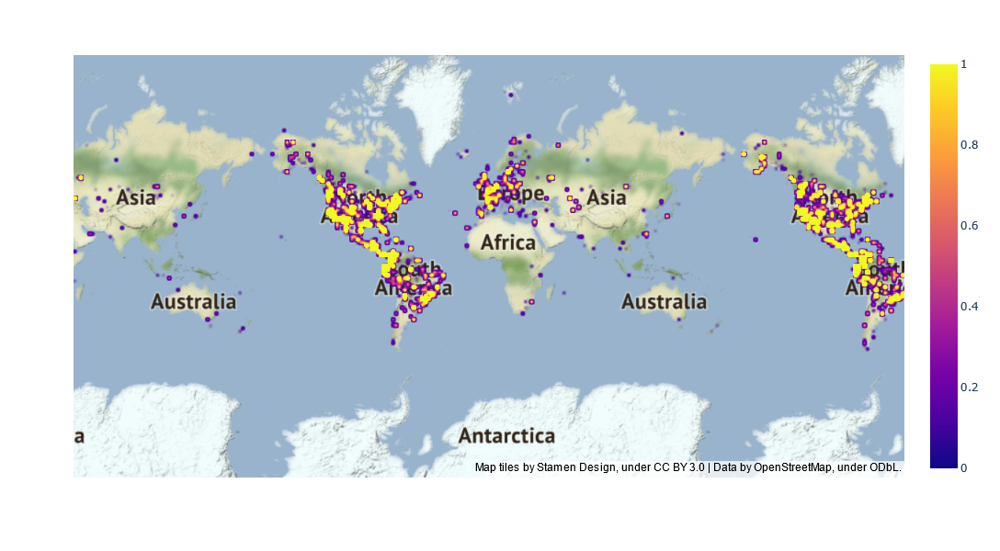

In [20]:
fig = px.density_mapbox(train_metadata, lat='latitude', lon='longitude', #z='Magnitude', 
                        radius=1,
                        center=dict(lat=0, lon=0), zoom=0,
                        mapbox_style="stamen-terrain")

fig.update_layout(width=1000, height=600)
fig.show()

# Geo-encoding

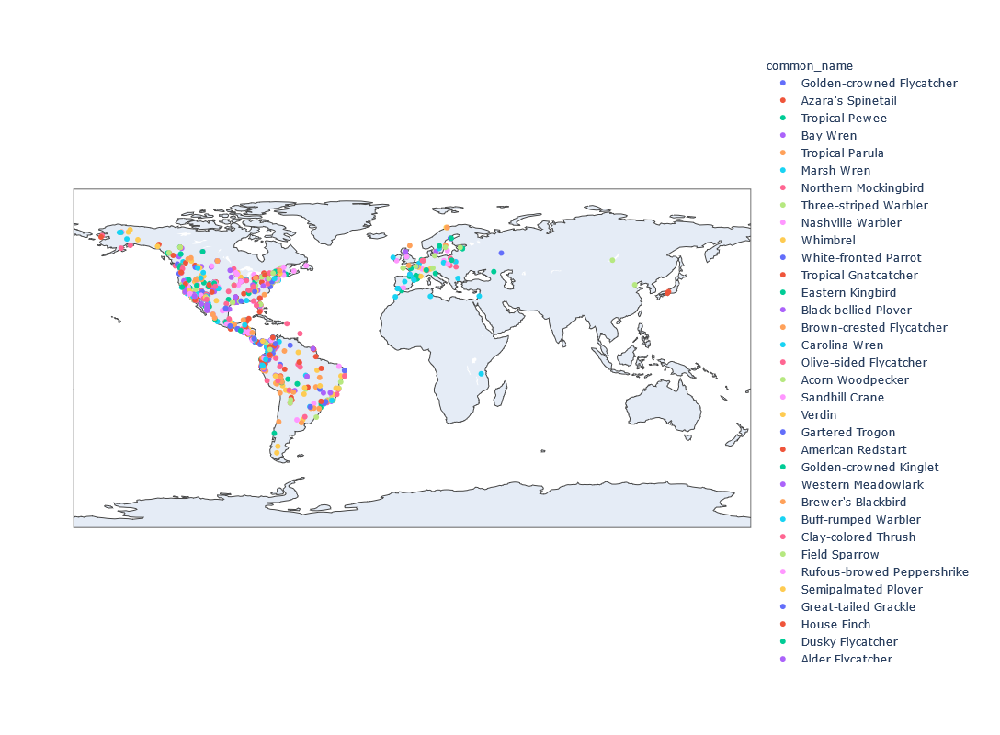

In [54]:
fig = px.scatter_geo(train_metadata.sample(1000), lat='latitude', lon='longitude', color='common_name', height=800, width=1000)
fig.show()

In [4]:
from geopy.geocoders import Nominatim

In [5]:
# initialize Nominatim API
geolocator = Nominatim(user_agent="geoapiExercises")

def extract_country(Latitude, Longitude):
    location = geolocator.reverse(Latitude+","+Longitude)
    try:
        return location.raw['address']['country']
    except KeyError:
        return location.raw['adress']['locality']
    except:
        return location.raw

In [60]:
countries = []
for lat,lon in tqdm(zip(train_metadata.latitude, train_metadata.longitude)): 
    countries.append(extract_country(str(lat), str(lon)))

0it [00:00, ?it/s]

KeyError: 'country'

# Data Cleaning

## Date & Time

In [6]:
from datetime import datetime
start = datetime(day=1,month=1,year=1960)
end = datetime(day=28,month=2,year=2021)

def date_checker(date):
    try:
        date = datetime.strptime(date, "%Y-%m-%d")
    except ValueError:
        return False
    
    if start <= date <= end:
        return True
    else:
        return False

date_check = train_metadata.date.apply(lambda date: date_checker(date))

In [7]:
train_metadata = train_metadata[date_check]

In [52]:
train_metadata['year'] = train_metadata['date'].apply(lambda date: int(date[:4]))
train_metadata['month'] = train_metadata['date'].apply(lambda date: int(date[5:7]))
train_metadata['day'] = train_metadata['date'].apply(lambda date: int(date[8:]))

In [43]:
'{0} rows {1} cols'.format(*train_metadata.shape)

'56843 rows 17 cols'

In [9]:
def time_checker(time):
    try:
        datetime.strptime(time, '%H:%M').time()
        return True
    except ValueError:
        return False

In [10]:
time_check = train_metadata.time.apply(lambda time: time_checker(time))

In [11]:
train_metadata = train_metadata[time_check]

In [54]:
train_metadata['hour'] = train_metadata['time'].apply(lambda time: int(time.split(':')[0]))

In [55]:
'{0} rows {1} cols'.format(*train_metadata.shape)

'56843 rows 18 cols'

# XGB Classification

In [77]:
from catboost import CatBoostClassifier

ModuleNotFoundError: No module named 'catboost'

In [26]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
random_state=42

In [22]:
y = train_metadata['primary_label']

In [56]:
X = train_metadata[['latitude', 'longitude', 'author', 'year', 'month', 'day', 'hour']]

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random_state)

In [73]:
model = xgb.XGBRFClassifier(enable_categorical=True)

In [74]:
model.fit(X_train, y_train)

ValueError: DataFrame.dtypes for data must be int, float, bool or categorical.  When
                categorical type is supplied, DMatrix parameter
                `enable_categorical` must be set to `True`.author

# Audio

In [13]:
import os

In [14]:
files = []

for folder in os.listdir('sample_audio'):
    for file in os.listdir(f'sample_audio/{folder}'):
        files.append(file)

In [15]:
audio_sample = train_metadata[train_metadata['filename'].isin(files)]

In [16]:
# Listen to it
import IPython.display as ipd

In [18]:
# Pick a file
audio_path = 'sample_audio/yetvir/XC120867.ogg'

ipd.Audio(audio_path, autoplay=True)

In [211]:
import numpy as np
import warnings
warnings.filterwarnings(action='ignore')

# Librosa is the most versatile audio library for Python 
# and uses FFMPEG to load and open audio files
# For more information visit: https://librosa.org/doc/latest/index.html
import librosa

# Load the first 15 seconds this file using librosa
sig, rate = librosa.load(audio_path, sr=32000, offset=None)

# The result is a 1D numpy array that conatains audio samples. 
# Take a look at the shape (seconds * sample rate == 15 * 32000 == 480000)
print('SIGNAL SHAPE:', sig.shape)

SIGNAL SHAPE: (1236777,)


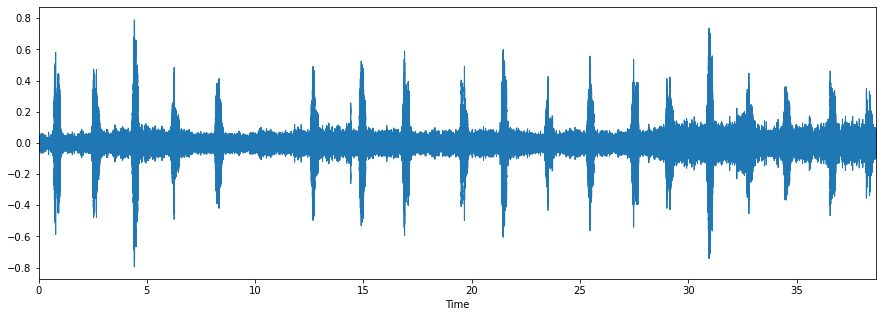

In [212]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(15, 5))
librosa.display.waveplot(sig, sr=32000)

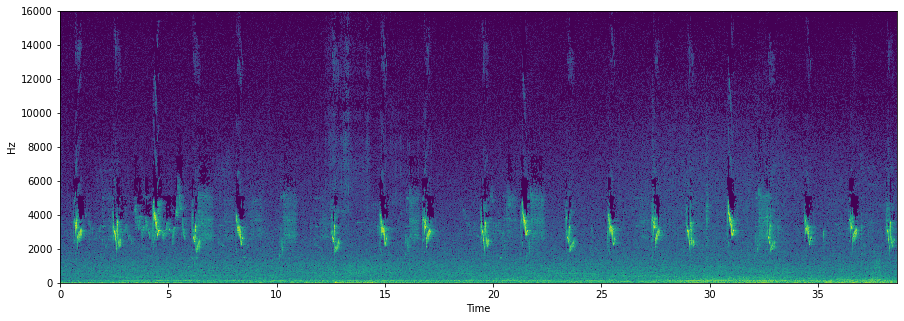

In [213]:
# First, compute the spectrogram using the "short-time Fourier transform" (stft)
spec = librosa.stft(sig)

# Scale the amplitudes according to the decibel scale
spec_db = librosa.amplitude_to_db(spec, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(15, 5))
librosa.display.specshow(spec_db, 
                         sr=32000, 
                         x_axis='time', 
                         y_axis='hz', 
                         cmap=plt.get_cmap('viridis'))

## ICA

https://towardsdatascience.com/independent-component-analysis-ica-in-python-a0ef0db0955e

In [198]:
from sklearn.decomposition import FastICA
from scipy import signal

In [214]:
ica = FastICA(n_components=3)
S_ = ica.fit_transform(spec_db)

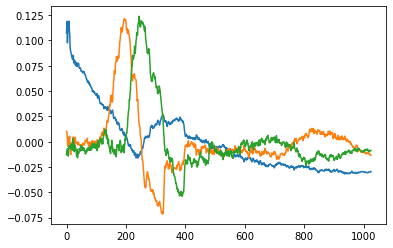

In [216]:
plt.plot(S_)
plt.show()

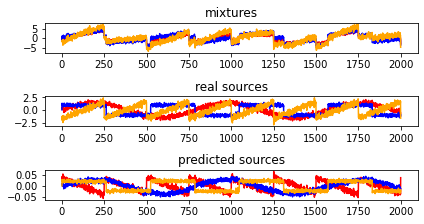

In [199]:
np.random.seed(0)
n_samples = 2000
time = np.linspace(0, 8, n_samples)
s1 = np.sin(2 * time)
s2 = np.sign(np.sin(3 * time))
s3 = signal.sawtooth(2 * np.pi * time)
S = np.c_[s1, s2, s3]
S += 0.2 * np.random.normal(size=S.shape)
S /= S.std(axis=0)
A = np.array([[1, 1, 1], [0.5, 2, 1.0], [1.5, 1.0, 2.0]])
X = np.dot(S, A.T)
ica = FastICA(n_components=3)
S_ = ica.fit_transform(X)
fig = plt.figure()
models = [X, S, S_]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']
for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()

In [200]:
X

array([[-0.74486315, -0.91401507, -1.81570038],
       [ 0.03932519,  1.06492993, -1.58715033],
       [-0.40766041,  0.39786915, -1.90998106],
       ...,
       [ 0.23856791, -0.28486909,  1.38619226],
       [-0.00653213, -0.99317023,  1.48134842],
       [-3.00301507, -3.62816891, -4.8258685 ]])